# Deep Dream

## Theoretical Explanation

References:
* https://www.youtube.com/watch?v=BsSmBPmPeYQ&t=3s
* https://www.youtube.com/watch?v=DgPaCWJL7XI&t=61s
* https://www.tensorflow.org/tutorials/generative/deepdream
* https://www.kaggle.com/code/franciscomesquita/deep-dream-weather-with-efficientnetb3
* https://analyticsindiamag.com/gradient-ascent-when-to-use-it-in-machine-learning/

DeepDream is an experiment that visualizes the patterns learned by a neural network. Similar to when a child watches clouds and tries to interpret random shapes, DeepDream over-interprets and enhances the patterns it sees in an image. It does so by forwarding an image through the network, then calculating the gradient of the image with respect to the activations of a particular layer. The image is then modified to increase these activations, enhancing the patterns seen by the network, and resulting in a dream-like image.

**It is almost only used in generative art but i do think that it can be used to interpret a network:** To fully understand a network prediction, we have to understand why it gives the output but also what the network sees from inside (patterns learned). The second part is what deep dream does in an somewhat abastract and over exaggerated way. It combines the input image with the activations of a particular layer producing a dream like image. This dream like image has a lot of usefull information. It is not in a direct and very perceptible way, but we can see the patterns learned by the network for each class through these images.


There is a demonstration in real time of what deep dream is:

<video width="510" height="305" controls>
  <source src="https://www.youtube.com/watch?v=DgPaCWJL7XI&t=61s" type="video/mp4">
</video>

We can see very dog faces and eyes. That is because the original Deep Dream network was trained on ImageNet dataset that as a lot of dogs in it. The network is just reproducing the patterns that it has learned. **If we use our network instead of that trained on imagenet, we can see the patterns learned by the network.**
Although it is very popular in generative and artificial art i could not found any other use for this concept.

**Gradient Ascent**

When creating DeepDream images, the idea is to modify input image so as to maximize the activation of a specific feature map or maps. It's like asking the neural network what it wants to see as input. Neural network itself guides the input modification process.

While training neural networks, we aim to decrease loss and use gradient descent for this purpose. To maximize an activation, we use gradient ascent.

The gradient ascent method advances in the direction of the gradient at each step. The gradient is assessed beginning at point P0, and the function proceeds to the next point, P1. The function then advances to P2 when the gradient is reevaluated at P1. This loop will continue until a stopping condition is fulfilled. The gradient operator always ensures that we are travelling in the best direction feasible.

<img src="https://149695847.v2.pressablecdn.com/wp-content/uploads/2022/06/image-142.png" width="600">

## Tensorflow General configs and imports

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

# TensorFlow ≥2.0 is required
import tensorflow as tf
assert tf.__version__ >= "2.0"

# Common imports
import pandas as pd 
import numpy as np
import seaborn as sns
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)


# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

## Imports

In [2]:
#Imports necessary
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Activation, Flatten, Dropout, BatchNormalization
from tensorflow.keras import optimizers, regularizers
from tensorflow.keras.applications.xception import Xception
from keras.applications.xception import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing import image
import cv2, os, shutil, math
from tensorflow import keras
import matplotlib.gridspec as gridspec
from IPython.display import Image, display
import matplotlib.cm as cm
import pathlib

## Data pre-processing

In [3]:
# Obtain and prepare dataset

data_dir = pathlib.Path('../input/monkeypoxdataset/MonkeypoxSkinDataset')

# Input size Final
batch_size = 32
IMG_SIZE = (124,124)

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  shuffle=True,
  image_size=IMG_SIZE,
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  shuffle=True,
  image_size=IMG_SIZE,
  batch_size=batch_size)

class_names = train_ds.class_names

Found 42350 files belonging to 6 classes.
Using 33880 files for training.
Found 42350 files belonging to 6 classes.
Using 8470 files for validation.


In [4]:
train_ds = train_ds.cache().prefetch(1)
val_ds = val_ds.cache().prefetch(1)

val_batches = val_ds.cardinality().numpy()
test_ds = val_ds.take(val_batches // 3) 
val_ds = val_ds.skip(val_batches // 3)

normalization_layer = keras.layers.experimental.preprocessing.Rescaling(1./255)

train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))
test_ds = test_ds.map(lambda x, y: (normalization_layer(x), y))

## Transfer Learning on Xception model

In [5]:
# create the base pre-trained model
base_model = keras.applications.xception.Xception(weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# and a logistic layer -- let's say we have 6 classes
predictions = Dense(6, activation='softmax')(x)

83697664/83683744 [==============================] - 4s 0us/step


In [6]:
# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

In [7]:
# this is the model we will train
xception_model = Model(inputs=base_model.input, outputs=predictions)

In [8]:
# Load model if already trained
# Ignore warning "Could not open.." - it will work even with that message

xception_model.load_weights('../input/xceptionmodeltf/xceptionmodeltfv2')

In [9]:
xception_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

In [10]:
# Even if you load an already trained model in cell above you need to compile it as well

optimizer = tf.keras.optimizers.Adam(epsilon=0.01)

xception_model.compile(
    optimizer=optimizer,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

In [11]:
# Training (will take time if no GPU or TPU is being used - even with GPU/TPU it takes a while)
# Dont run it if you already load the weights

history = xception_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs = 10,
)

Epoch 1/10
1059/1059 [==============================] - 97s 84ms/step - loss: 0.3508 - accuracy: 0.8814 - val_loss: 0.4083 - val_accuracy: 0.8536
Epoch 2/10
1059/1059 [==============================] - 36s 34ms/step - loss: 0.3374 - accuracy: 0.8853 - val_loss: 0.3961 - val_accuracy: 0.8566
Epoch 3/10
1059/1059 [==============================] - 36s 34ms/step - loss: 0.3222 - accuracy: 0.8903 - val_loss: 0.3858 - val_accuracy: 0.8590
Epoch 4/10
1059/1059 [==============================] - 37s 35ms/step - loss: 0.3091 - accuracy: 0.8945 - val_loss: 0.3776 - val_accuracy: 0.8624
Epoch 5/10
1059/1059 [==============================] - 36s 34ms/step - loss: 0.2981 - accuracy: 0.8983 - val_loss: 0.3711 - val_accuracy: 0.8636
Epoch 6/10
1059/1059 [==============================] - 36s 34ms/step - loss: 0.2886 - accuracy: 0.9016 - val_loss: 0.3658 - val_accuracy: 0.8677
Epoch 7/10
1059/1059 [==============================] - 36s 34ms/step - loss: 0.2804 - accuracy: 0.9043 - val_loss: 0.3615 -

<AxesSubplot:>

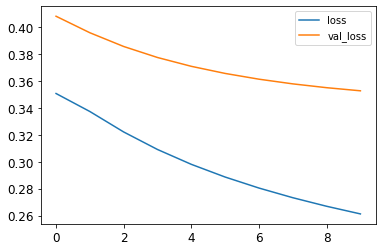

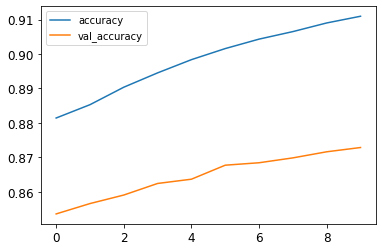

In [12]:
# Results visualization
# Loss and validation loss variation 

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['accuracy', 'val_accuracy']].plot()

In [13]:
#Save the previous trained model

modelSaving = xception_model.save_weights('./xceptionmodel', save_format='h5')

In [14]:
#test sample evaluation

score = xception_model.evaluate(test_ds)
print("Test loss: ", score[0])
print("Test accuracy: ", score[1])

88/88 [==============================] - 3s 29ms/step - loss: 0.3263 - accuracy: 0.8835
Test loss:  0.3263017535209656
Test accuracy:  0.8835227489471436


## Implementing Deep Dream

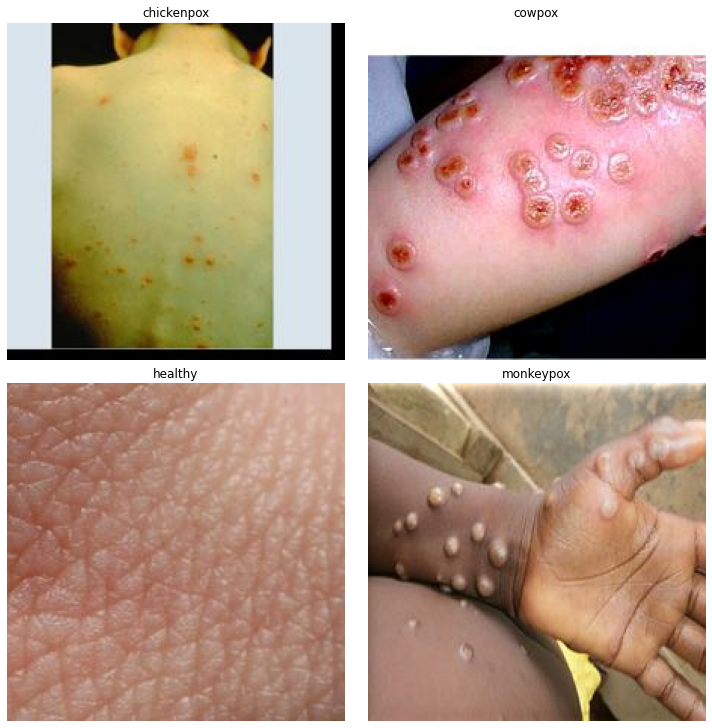

In [15]:
#It could be used any image and respective label here.
names = ["chickenpox", "cowpox","healthy","monkeypox"]
paths = ["../input/monkeypoxdataset/MonkeypoxSkinDataset/chickenpox/aug_ch_0001_0005.jpg",         
         "../input/monkeypoxdataset/MonkeypoxSkinDataset/cowpox/aug_co_0001_0014.jpg",
         "../input/monkeypoxdataset/MonkeypoxSkinDataset/healthy/aug_he_0001_0016.jpg",
         "../input/monkeypoxdataset/MonkeypoxSkinDataset/monkeypox/aug_mo_0001_0004.jpg"]

def read_images(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = image[...,::-1]
    return image
    
def plot_images(images):
    fig = plt.figure(constrained_layout = True, figsize=(10, 10))
    gs = gridspec.GridSpec(nrows=2, ncols=2, figure=fig)
    for i in range(4):
        y, x = i//2, i%2 
        ax = fig.add_subplot(gs[y,x]) 
        ax.imshow(np.uint8(images[i]))
        ax.axis("off")
        ax.title.set_text(names[i])
        
images = []
for path in paths:
    images.append(read_images(path))
plot_images(images)

In [16]:
# we will take outputs of last 3 blocks - The name can change (consult model.summary())
outputs = [xception_model.get_layer("add_9").output,
           xception_model.get_layer("add_10").output,
           xception_model.get_layer("add_11").output]

model = Model(inputs=xception_model.inputs, outputs=outputs)

In [17]:
learning_rate = 0.01 #It has the same meaning that it has in the gradient descent algorithm
iterations = 150 #Number of iterations that the image will pass through the network

def gradient_ascent(image, block_id):  
    image = tf.expand_dims(image, axis=0)
    for d in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(image)
            
            # get block activation maps
            maps = model(image)  
            strength = tf.reduce_mean(tf.abs(maps[block_id]))

        # get gradients stored in tape
        gradients = tape.gradient(strength, image)

        # normalize gradients
        gradients /= (tf.math.reduce_std(gradients) + 1e-10)

        # modify input image
        image += learning_rate * gradients

    return image[0]

In [18]:
def deprocess(image):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    
    image[..., 0] *= std[0]
    image[..., 1] *= std[1]
    image[..., 2] *= std[2]
    
    image[..., 0] += mean[0]
    image[..., 1] += mean[1]
    image[..., 2] += mean[2]
       
    image *= 255.0
    image = np.clip(image, 0, 255) 

    return image

In [19]:
img_size = tf.convert_to_tensor([(140, 140), (170, 170), (205, 205),
                     (245, 245), (300, 300), (355, 355), (425, 425),
                     (512, 512), (614, 614), (740, 740)])

def deepdream(image_in):
    results = []
    for block_id in range(len(outputs)):
        image = preprocess_input(image_in)
        image = tf.convert_to_tensor(image)
        for s in img_size:
            image = tf.image.resize(image, s) 
            image = gradient_ascent(image, block_id)
            
        results.append(deprocess(image.numpy()))
    return results

In [20]:
titles = ["Original Image",
          "After maximizing the output of Block 11",
          "After maximizing the output of Block 12",
          "After maximizing the output of Block 13"]

def plot_results(image, results):
    image = cv2.resize(image, (448, 448), interpolation = cv2.INTER_CUBIC)
    fig = plt.figure(constrained_layout = True, figsize=(9, 32))
    gs = gridspec.GridSpec(nrows=4, ncols=1, figure=fig, height_ratios = [1,2,2,2])
    for i in range(4):
        y, x = i//1, i%1 
        ax = fig.add_subplot(gs[y,x])
        if i > 0:
            image = results[i-1]
        ax.imshow(np.uint8(image))
        ax.axis("off")
        ax.title.set_text(titles[i])

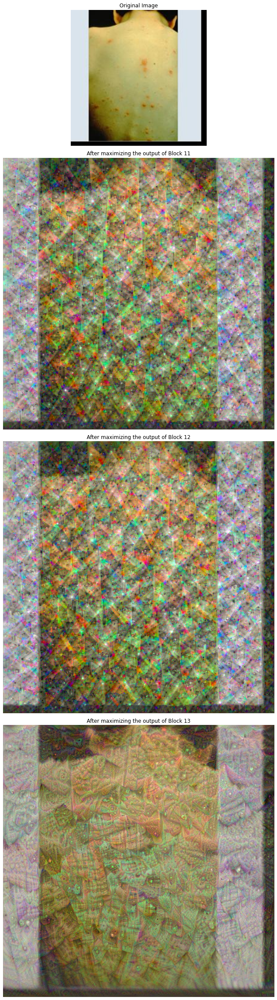

In [21]:
#For less time just reduce the iterations parameter
results = deepdream(images[0])
plot_results(images[0], results)

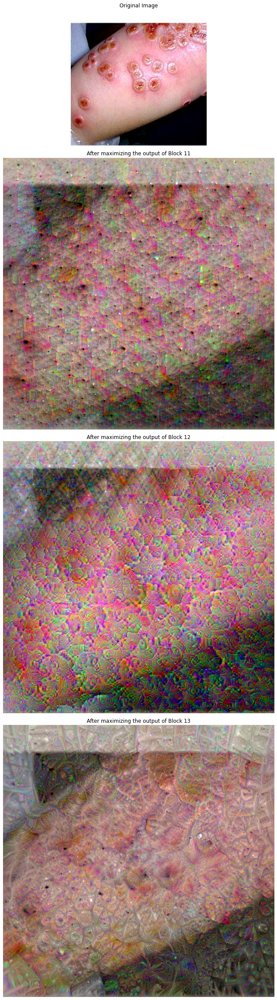

In [22]:
results = deepdream(images[1])
plot_results(images[1], results)

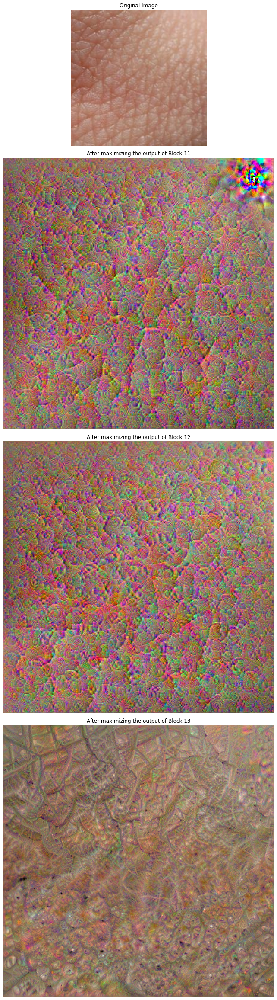

In [23]:
results = deepdream(images[2])
plot_results(images[2], results)

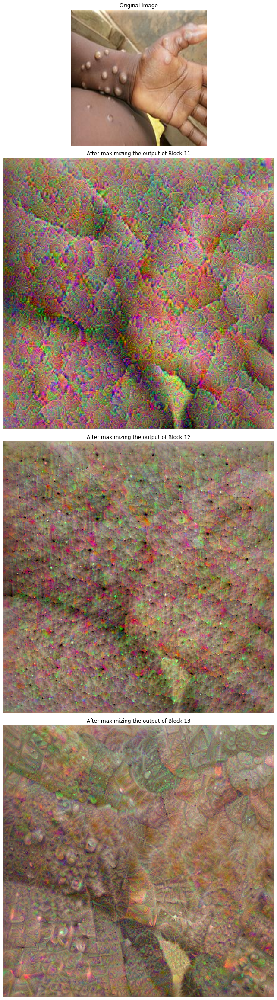

In [24]:
results = deepdream(images[3])
plot_results(images[3], results)

**The results after maximizing the output of the last block gives us a very intersting and detailed patterns. It is hard to see the patterns and it is even more hard to say clearly that can be used to interpret anything but it turns out to be what the network sees internally. Is it possible that what the networks create internally to classify some images classes can be fully interpreted by people? it is something that I have seen many people question, and looking at the various techniques that exist to visualize neural networks internally I totally understand the question.**

Like all techniques it depends on data. Always see the examples on cats and dogs. There we can see the network internally and understand what happens but in some data there is no good way to see if the patterns learn by the network are correct and the most suitable.